In [1]:
import torch
import os
from torchvision import transforms
import urllib.request
from PIL import Image
from torchvision import models, transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
from IPython.display import display
import numpy as np

# Func: Denormalize and display the processed image
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    tensor = tensor * std + mean
    tensor = torch.clamp(tensor, 0, 1)
    return tensor

# Func: Loss graph
def plot_loss_trajectory(history_loss):
    """
    Plots the Cross-Entropy loss over the PGD attack iterations,
    annotating every single point with its exact value.
    """
    # Created a slightly wider figure to give the text room to breathe
    plt.figure(figsize=(14, 6))
    
    # Plot the loss data
    plt.plot(history_loss, color='green', linewidth=3, marker='^', markersize=8, linestyle='-')
    
    # Add titles and labels
    plt.title("Adversarial Attack: Loss Trajectory", fontsize=16, fontweight='bold', pad=15)
    plt.xlabel("PGD Iteration Step", fontsize=14, fontweight='bold')
    plt.ylabel("Cross-Entropy Loss", fontsize=14, fontweight='bold')
    
    # Loop through every point and add its value
    for i, loss in enumerate(history_loss):
        plt.annotate(f"{loss:.3f}",           # Format to 3 decimal places
                     xy=(i, loss),            # The exact point to attach to
                     xytext=(0, 10),          # Offset text 10 points UP
                     textcoords="offset points", 
                     ha='center',             # Center text over the point
                     va='bottom', 
                     color='darkgreen', 
                     fontsize=10,
                     rotation=45)             # Slightly rotated to prevent overlapping!
    
    # Add a grid for readability
    plt.grid(True, linestyle='--', alpha=0.7, linewidth=1.5)
    plt.tick_params(labelsize=12)
    
    # Expand the Y-axis slightly so the top numbers don't get cut off
    if history_loss:
        plt.ylim(0, max(history_loss) * 1.15)
    
    # Clean up layout and display
    plt.tight_layout()
    plt.show()

# Func: PGD steps vizualization
def visualize_pgd_step(step, adv_batch, orig_batch, history_dog, history_cat):
    """
    Handles the plotting of the original image, adversarial image, 
    the amplified noise (changes), and the confidence trajectory.
    """
    # Create an even wider figure to accommodate 4 plots
    fig = plt.figure(figsize=(32, 10)) 
    gs = fig.add_gridspec(1, 4, width_ratios=[0.9, 0.9, 0.9, 1.5], hspace=0.3, wspace=0.35)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[0, 2])
    ax4 = fig.add_subplot(gs[0, 3])
    
    # --- 1. Original Image Visualization ---
    orig_img = orig_batch[0].detach().cpu().permute(1, 2, 0).numpy()
    orig_img = orig_img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
    ax1.imshow(orig_img.clip(0, 1))
    ax1.set_title("Original Image", fontsize=15, fontweight='bold', pad=15)
    ax1.axis('off')
    
    # --- 2. Adversarial Image Visualization ---
    adv_img = adv_batch[0].detach().cpu().permute(1, 2, 0).numpy()
    adv_img = adv_img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
    ax2.imshow(adv_img.clip(0, 1))
    ax2.set_title(f"Step {step+1}: Adversarial Image", fontsize=15, fontweight='bold', pad=15)
    ax2.axis('off')

    # --- 3. The Changes (Amplified Perturbation) ---
    # Calculate the raw difference between the tensors
    noise = (adv_batch[0] - orig_batch[0]).detach().cpu().permute(1, 2, 0).numpy()
    
    # Take the absolute value and magnify it so human eyes can see the pattern
    magnification = 20 
    noise_viz = np.abs(noise) * magnification
    
    ax3.imshow(noise_viz.clip(0, 1))
    ax3.set_title(f"Amplified Changes (x{magnification})", fontsize=15, fontweight='bold', pad=15)
    ax3.axis('off')
    
    # --- 4. Confidence Trajectory Plot ---
    all_confidences = history_dog + history_cat
    y_min = max(0, min(all_confidences) - 5)
    y_max = min(100, max(all_confidences) + 5)
    
    ax4.plot(history_dog, color='blue', label='Dog Confidence', linewidth=4.5, marker='o', markersize=8)
    ax4.plot(history_cat, color='red', label='Cat Confidence', linewidth=4.5, marker='s', markersize=8)
    
    current_x = len(history_dog) - 1
    
    # Dog Percentage Text
    ax4.annotate(f"{history_dog[-1]:.1f}%", 
                 xy=(current_x, history_dog[-1]), 
                 xytext=(0, 12), textcoords="offset points", 
                 ha='center', color='blue', fontweight='bold', fontsize=13)
                 
    # Cat Percentage Text
    ax4.annotate(f"{history_cat[-1]:.1f}%", 
                 xy=(current_x, history_cat[-1]), 
                 xytext=(0, -18), textcoords="offset points", 
                 ha='center', color='red', fontweight='bold', fontsize=13)

    ax4.set_ylim(y_min, y_max)
    ax4.set_xlim(0, 25) # Adjust this if your max_steps visually exceeds 25
    
    ax4.set_title("Model Confidence Race", fontsize=16, fontweight='bold', pad=15)
    ax4.set_ylabel("Confidence (%)", fontsize=14, fontweight='bold')
    ax4.set_xlabel("PGD Iteration Step", fontsize=14, fontweight='bold')
    ax4.legend(loc="center right", fontsize=13, frameon=True, shadow=True)
    ax4.grid(True, linestyle='--', alpha=0.7, linewidth=1.5)
    ax4.tick_params(labelsize=12)
    
    plt.tight_layout()
    display(fig)
    plt.close(fig)

def visualize_image_comparison(original_image, processed_image):
    """
    Visualizes the original image alongside the preprocessed image side-by-side.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    ax1.imshow(original_image)
    ax1.axis('off')
    ax1.set_title("Original Image", fontsize=16)

    ax2.imshow(processed_image)
    ax2.axis('off')
    ax2.set_title("Processed Image (After Preprocessing)", fontsize=16)

    plt.tight_layout()
    plt.show()

def plot_baseline_prediction(top3_catid, top3_prob, categories):
    """
    Plots a horizontal bar chart of the top 3 model predictions with confidence percentages.
    """
    plt.figure(figsize=(6, 5))

    # Extract labels and probabilities
    labels = [f"[{i}] {categories[i]}" for i in top3_catid]
    probs = [p.item() * 100 for p in top3_prob]

    # Create horizontal bar chart
    # We use [::-1] to ensure the highest probability is at the top
    bars = plt.barh(labels[::-1], probs[::-1], color=['#cccccc', '#cccccc', '#4CAF50'])

    # Add numerical labels to the end of each bar
    for bar in bars:
        width = bar.get_width()
        plt.text(width + 1,                        # X position (slightly to the right of the bar)
                 bar.get_y() + bar.get_height()/2, # Y position (centered vertically)
                 f'{width:.1f}%',                  # The label text
                 va='center',                      # Center alignment
                 fontsize=10, 
                 fontweight='bold')

    # Graph Formatting
    plt.xlabel('Confidence (%)', fontsize=12)
    plt.title("Baseline Model Prediction", fontsize=16)
    
    # Extended limit slightly to 110 so the text labels don't get cut off at 100%
    plt.xlim(0, 110) 

    plt.tight_layout()
    plt.show()

def save_adversarial_image(adv_tensor, output_path):
    # Denormalize the adversarial image 
    # (Assuming the 'denormalize' function is defined elsewhere in your script)
    adv_denorm = denormalize(adv_tensor)

    # Convert to PIL Image
    adv_pil = transforms.ToPILImage()(adv_denorm)

    # Save to filesystem
    adv_pil.save(output_path)

    # Print confirmation
    print(f"Image saved successfully!")
    print(f"File: {output_path}")
    print(f"Location: {os.path.abspath(output_path)}")
    
    return adv_pil

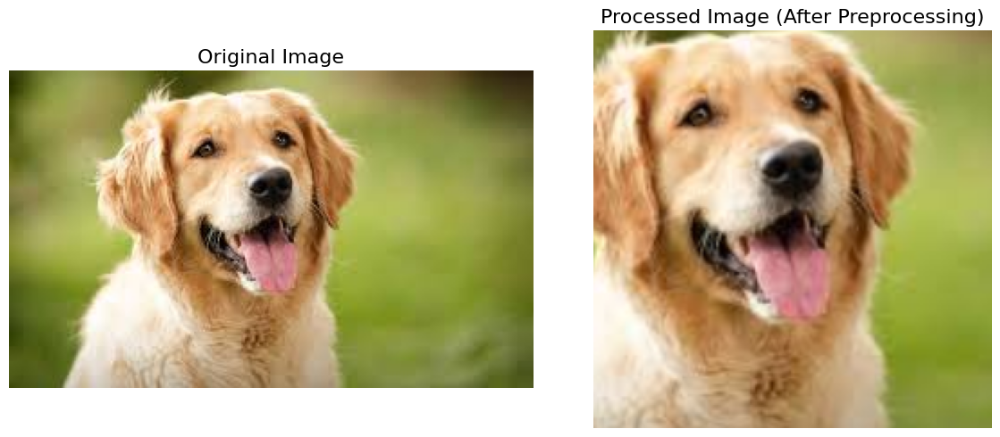

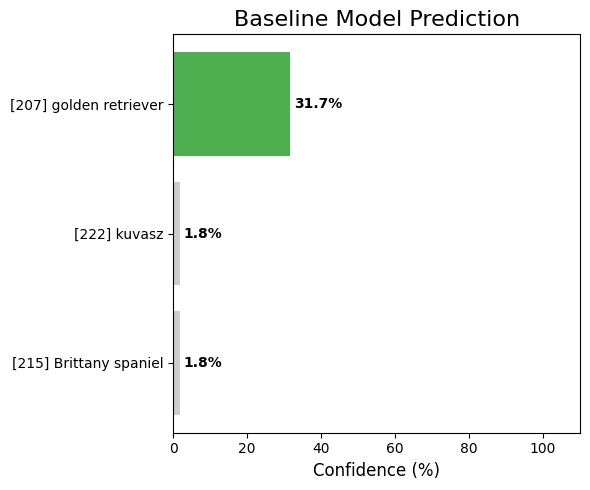


Target class for adversarial attack: tabby


In [2]:
# Load the pre-trained MobileNetV2 model
weights = models.MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
model.eval() # Set to evaluation mode!

# Fetch ImageNet labels
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
response = urllib.request.urlopen(url)
categories = [line.decode('utf-8').strip() for line in response.readlines()]

# Define the standard preprocessing pipeline
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load and preprocess the image
image_path = "original_dog.jpg" 
input_image = Image.open(image_path).convert("RGB")
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # Create a mini-batch of size 1


# Convert tensor to image
processed_tensor = denormalize(input_tensor)
processed_image = transforms.ToPILImage()(processed_tensor)

# Display original vs processed image
visualize_image_comparison(input_image, processed_image)

# Get the baseline prediction
with torch.no_grad():
    output = model(input_batch)

# Convert raw scores to probabilities and get the top 3 most likely predictions
probabilities = F.softmax(output[0], dim=0)
top3_prob, top3_catid = torch.topk(probabilities, 3)

plot_baseline_prediction(top3_catid, top3_prob, categories)

# Define the target class (tabby cat) for the adversarial attack
# Find cat in the ImageNet categories
target_class_idx = next((i for i, cat in enumerate(categories) if 'tabby' in cat.lower()), 281)
target_tensor = torch.tensor([target_class_idx])
print(f"\nTarget class for adversarial attack: {categories[target_class_idx]}")

Initial Image Prediction: 207
Step 1 Loss: 8.1447 | Prediction: [207] golden retriever


C:\Users\sahil\AppData\Local\Temp\ipykernel_4768\705060456.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


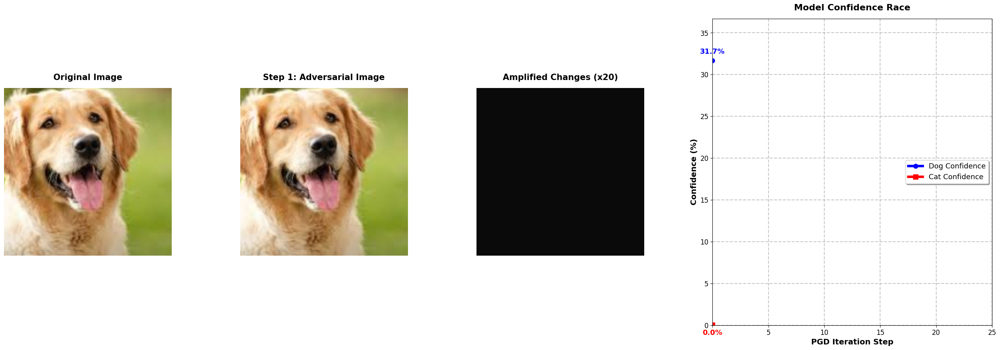

Step 2 Loss: 7.4672 | Prediction: [207] golden retriever


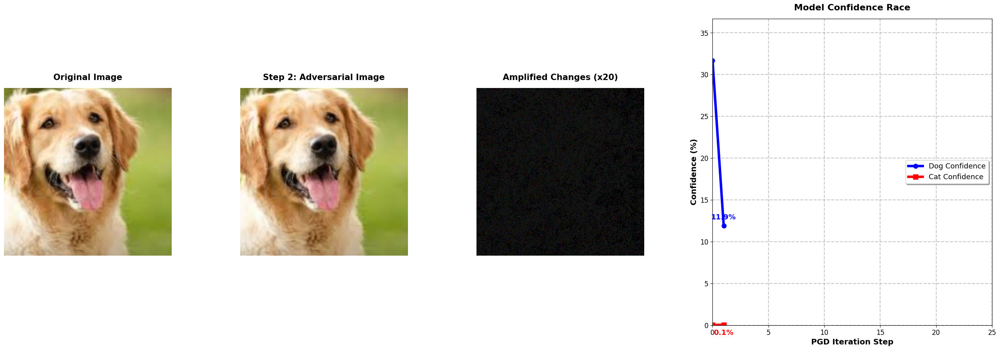

Step 3 Loss: 6.9340 | Prediction: [207] golden retriever


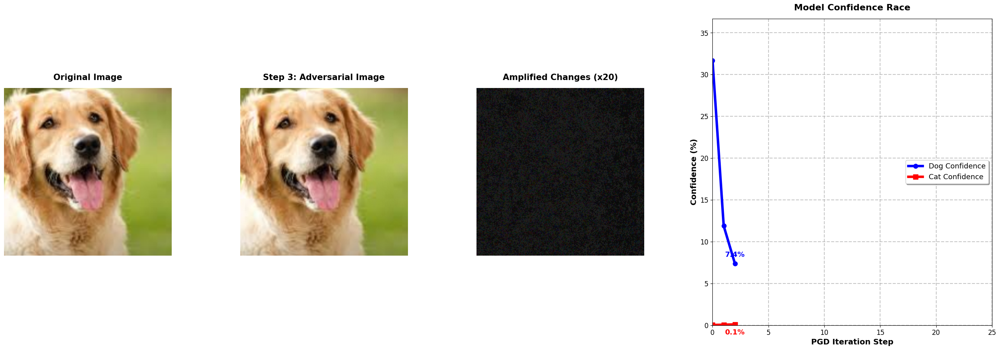

Step 4 Loss: 6.4459 | Prediction: [207] golden retriever


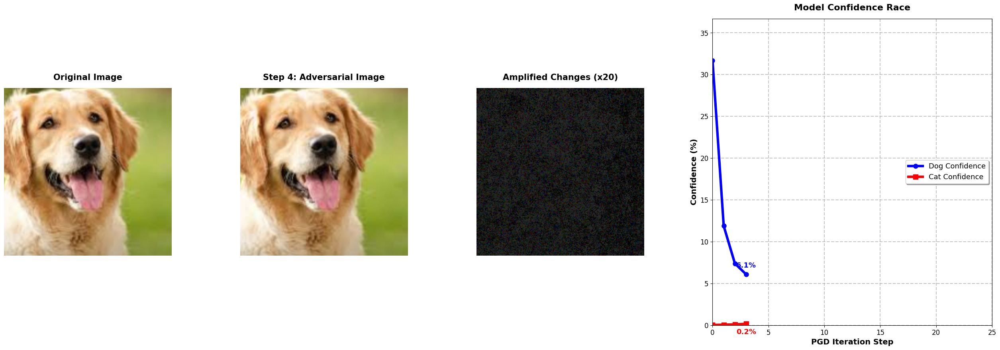

Step 5 Loss: 5.9389 | Prediction: [207] golden retriever


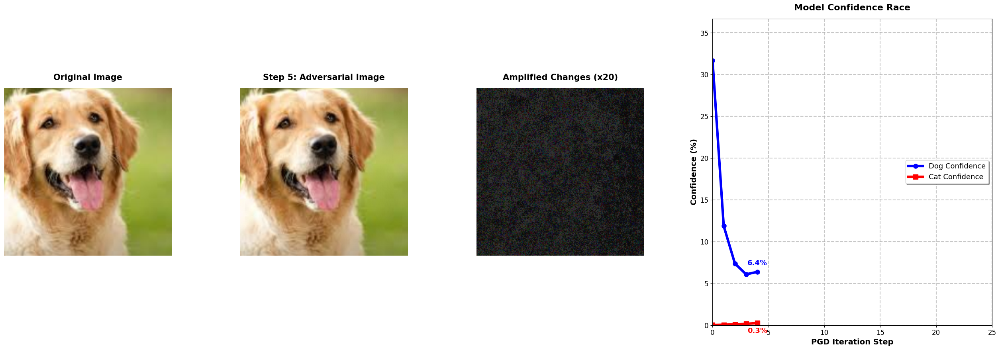

Step 6 Loss: 5.3793 | Prediction: [207] golden retriever


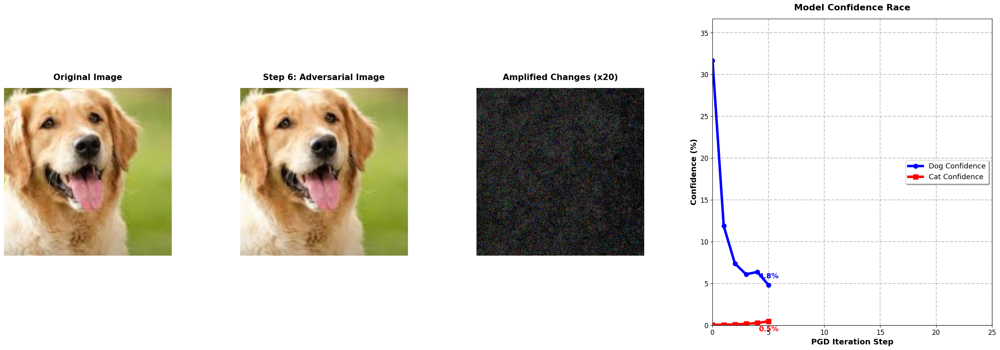

Step 7 Loss: 4.6841 | Prediction: [207] golden retriever


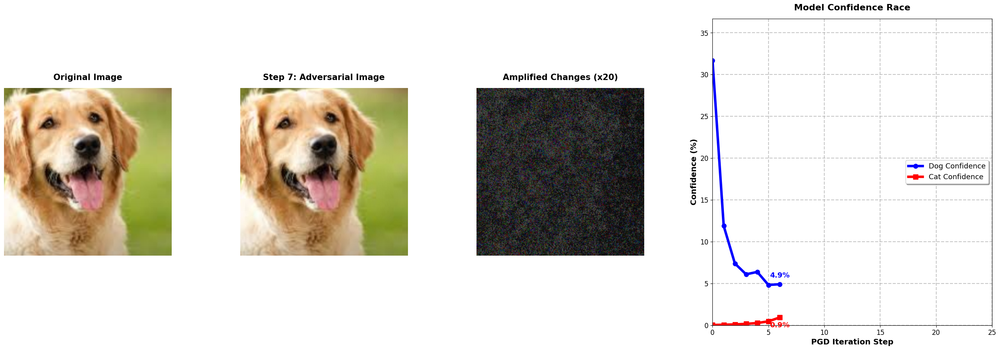

Step 8 Loss: 4.1283 | Prediction: [207] golden retriever


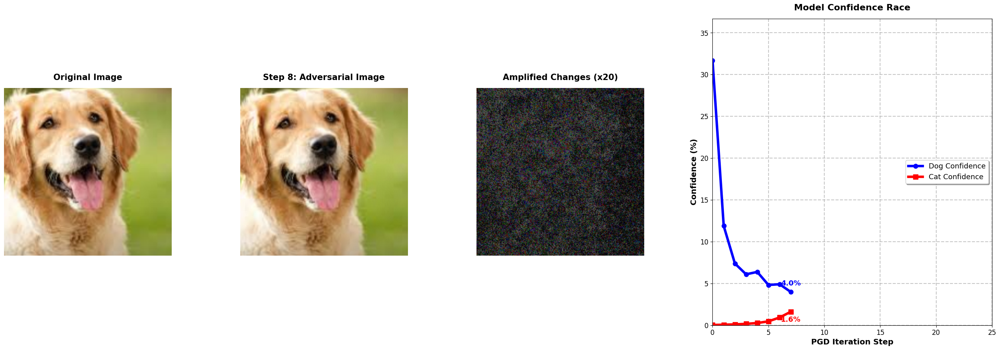

Step 9 Loss: 3.6898 | Prediction: [207] golden retriever


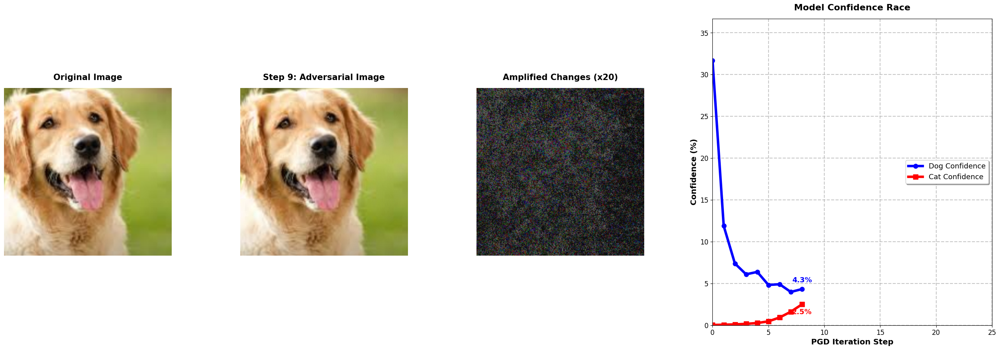

🎉 Attack Successful! Model classified as Cat at step 10


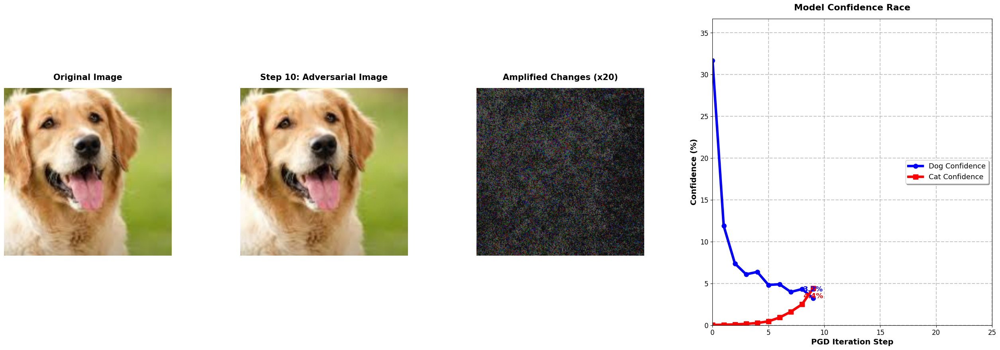

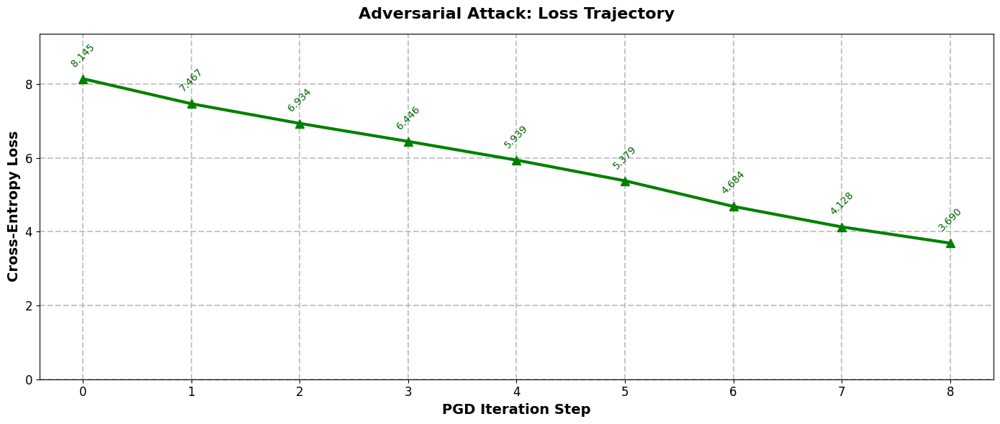

All steps completed!
Image saved successfully!
File: adversarial_image.png
Location: c:\Users\sahil\OneDrive\bsides\adversarial_image.png
Image saved successfully!
File: original_processed_image.png
Location: c:\Users\sahil\OneDrive\bsides\original_processed_image.png


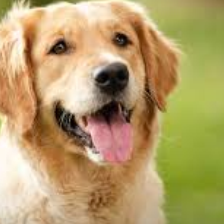

In [3]:
# PGD attack parameters
alpha = 0.002 # Attack step size per iteration
epsilon = 0.15 # Maximum allowed adversarial change limit
max_steps = 100 # Maximum number of attack iterations 

adv_batch = input_batch.clone().detach()
orig_batch = input_batch.clone().detach()

with torch.no_grad():
    # Get initial predicted class ID
    dog_class_idx = torch.argmax(model(orig_batch)).item()

print(f"Initial Image Prediction: {dog_class_idx}")
history_dog = []
history_cat = []
history_loss = []

# Display each step as a separate image
for step in range(max_steps):
    # Enable gradient tracking 
    adv_batch.requires_grad = True
    # Get model predictions
    output = model(adv_batch)
    
    # Convert raw model scores into probabilities
    probs = F.softmax(output[0], dim=0)
    history_dog.append(probs[dog_class_idx].item() * 100)
    history_cat.append(probs[target_class_idx].item() * 100)
    
    # Get the current predicted class ID
    current_pred = torch.argmax(output).item()
    
    # THE EXIT CONDITION
    if current_pred == target_class_idx:
        print(f"🎉 Attack Successful! Model classified as Cat at step {step+1}")
        # Call the visualization here so we can see the winning step before exiting!
        visualize_pgd_step(step, adv_batch, orig_batch, history_dog, history_cat)
        break 
        
    # Calculate the error compared to our target class
    loss = F.cross_entropy(output, target_tensor)
    history_loss.append(loss.item())
    print(f"Step {step+1} Loss: {loss.item():.4f} | Prediction: [{current_pred}] {categories[current_pred]}")
    # Calculate the gradients to see which direction we need to change the pixels
    model.zero_grad()
    loss.backward()
    
    # The actual PGD math
    with torch.no_grad():
        # minimize the loss (error) between the current output and the target label
        step_adv = adv_batch - alpha * adv_batch.grad.sign() 
        # calculate noise
        perturbation = step_adv - orig_batch
        # Keep changes under epsilon limit 
        perturbation = torch.clamp(perturbation, -epsilon, epsilon)
        # Manipulated image
        adv_batch = orig_batch + perturbation
    
    # Passing 'orig_batch' instead of 'perturbation'
    visualize_pgd_step(step, adv_batch, orig_batch, history_dog, history_cat)
    
plot_loss_trajectory(history_loss)
print("All steps completed!")
save_adversarial_image(adv_batch[0], output_path="adversarial_image.png")
save_adversarial_image(input_batch[0], output_path="original_processed_image.png")